# Air BnB Exploratory Data Analysis

In this exploratory data analysis, we will be looking at a Airbnb dataset from Kaggle with about 260,000 entries and 55 variables in an attempt to determine hidden trends in pricing and location that could then be leveraged into optimizing a travel plan to minimize cost. To achieve this the focus of this EDA will be on the variables price, city, longitude, latitude, and property type. Using these variables we will summarize and visualize the data through interactive heat maps and bar graphs in order to determine key relationships between price, location, and property type allowing for cost effective travel planning.

In [1]:
bnbIDPrice = './archive/sample_submission.csv'
dataSet = './archive/train.csv'
dataTest = './archive/test.csv'
dataCity = './archive/geonames-all-cities-with-a-population-1000.csv'

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import numpy as np
import seaborn as sns
import folium
from folium import plugins
from folium.plugins import HeatMap
from geopy.geocoders import Nominatim
import time
import pycountry_convert
import pycountry
from forex_python.converter import CurrencyRates
from scipy.spatial import cKDTree

In [3]:
df = pd.read_csv(dataSet)
geo_cities = pd.read_csv(dataCity, delimiter=";")
df_copy = df.copy()

In [4]:
df.describe()

,id,host_id,host_listings_count,host_total_listings_count,latitude,longitude,accommodates,bathrooms,bedrooms,beds,...,estimated_occupancy_l365d,estimated_revenue_l365d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,reviews_per_month
count,2.618940e+05,2.618940e+05,261771.000000,261771.000000,261894.000000,261894.000000,261894.000000,261769.000000,261542.000000,261404.000000,...,122229.000000,122229.000000,210942.000000,210935.000000,210934.000000,210927.000000,210933.000000,210929.000000,210928.000000,210943.000000
mean,6.124087e+17,2.204047e+08,75.654820,112.045765,32.653782,-13.057419,3.950820,1.393651,1.650263,2.336988,...,84.733803,13755.051755,4.748371,4.777729,4.739261,4.830257,4.838841,4.776649,4.662385,1.435113
std,5.252021e+17,2.031357e+08,413.652997,582.889065,24.486725,71.483957,2.441313,0.790719,1.143739,1.829691,...,92.520170,21124.214462,0.392996,0.377133,0.403333,0.341982,0.343688,0.334551,0.424181,1.725668
min,6.000000e+00,2.900000e+01,0.000000,0.000000,-43.440110,-159.714280,1.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.010000
25%,3.800805e+07,3.525372e+07,1.000000,2.000000,34.126130,-73.959310,2.000000,1.000000,1.000000,1.000000,...,0.000000,0.000000,4.670000,4.730000,4.670000,4.800000,4.820000,4.700000,4.570000,0.300000
50%,7.600672e+17,1.460205e+08,3.000000,4.000000,40.212195,2.160524,4.000000,1.000000,1.000000,2.000000,...,48.000000,5940.000000,4.860000,4.890000,4.860000,4.930000,4.950000,4.880000,4.760000,0.860000
75%,1.109411e+18,4.144555e+08,15.000000,20.000000,45.698861,14.775177,5.000000,2.000000,2.000000,3.000000,...,156.000000,19140.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,4.910000,2.000000
max,1.377118e+18,6.837397e+08,5374.000000,9988.000000,60.025359,153.634660,16.000000,50.000000,50.000000,121.000000,...,255.000000,255000.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,82.600000


In [5]:
df.isna().sum().sort_values(ascending=False)

host_neighbourhood             158979
estimated_occupancy_l365d      139665
estimated_revenue_l365d        139665
availability_eoy               139665
number_of_reviews_ly           139665
neighborhood_overview          134207
neighbourhood                  134206
host_about                     126186
host_location                   66830
review_scores_checkin           50967
review_scores_value             50966
review_scores_location          50965
review_scores_communication     50961
review_scores_cleanliness       50960
review_scores_accuracy          50959
review_scores_rating            50952
first_review                    50951
reviews_per_month               50951
last_review                     50951
host_response_time              40247
host_response_rate              40247
host_acceptance_rate            22546
neighbourhood_cleansed           8693
host_is_superhost                7373
description                      6093
has_availability                 2286
beds        

In [6]:
df['property_type'].value_counts().sort_values(ascending=False)

property_type
Entire rental unit                106394
Entire home                        39892
Entire condo                       21832
Private room in rental unit        19204
Private room in home               16168
                                   ...  
Shared room in casa particular         1
Private room in tipi                   1
Shared room in dome                    1
Shared room in aparthotel              1
Riad                                   1
Name: count, Length: 141, dtype: int64

In [7]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']

numeric_df = df.select_dtypes(include=numerics)
len(numeric_df.columns)

30

In [8]:
df.city.value_counts().sort_values(ascending=False)

city
London            16890
Paris             16008
Sicily            13686
Puglia            10792
Los Angeles        9421
                  ...  
Bozeman             137
Albany              102
Barossa Valley       82
Salem, OR            81
Pacific Grove        70
Name: count, Length: 108, dtype: int64

# Clean and Process the data

In [9]:
geo_cities = geo_cities[['Name', 'Country name EN', 'Coordinates']].drop_duplicates(subset='Name')

df_copy = df_copy.dropna(subset=['latitude', 'longitude'])

geo_cities['lat'] = geo_cities['Coordinates'].apply(lambda x: float(x.split(',')[0]))
geo_cities['lon'] = geo_cities['Coordinates'].apply(lambda x: float(x.split(',')[1]))
geo_coords = np.vstack((geo_cities['lat'], geo_cities['lon'])).T

tree = cKDTree(geo_coords)

airbnb_coords = np.vstack((df_copy['latitude'], df_copy['longitude'])).T

dist, idx = tree.query(airbnb_coords, k=1)
df_copy['mapped_city'] = geo_cities.iloc[idx]['Name'].values
df_copy['country'] = geo_cities.iloc[idx]['Country name EN'].values

country_to_currency = {
    "Afghanistan": "AFN", "Albania": "ALL", "Algeria": "DZD", "Andorra": "EUR",
    "Angola": "AOA", "Antigua and Barbuda": "XCD", "Argentina": "ARS", "Armenia": "AMD",
    "Australia": "AUD", "Austria": "EUR", "Azerbaijan": "AZN", "Bahamas": "BSD",
    "Bahrain": "BHD", "Bangladesh": "BDT", "Barbados": "BBD", "Belarus": "BYN",
    "Belgium": "EUR", "Belize": "BZD", "Benin": "XOF", "Bhutan": "BTN", "Bolivia": "BOB",
    "Bosnia and Herzegovina": "BAM", "Botswana": "BWP", "Brazil": "BRL", "Brunei": "BND",
    "Bulgaria": "BGN", "Burkina Faso": "XOF", "Burundi": "CDF", "Cabo Verde": "CVE",
    "Cambodia": "KHR", "Cameroon": "CDF", "Canada": "CAD", "Central African Republic": "CDF",
    "Chad": "CDF", "Chile": "CLP", "China": "CNY", "Colombia": "COP", "Comoros": "COM",
    "Congo (Congo-Brazzaville)": "CDF", "Congo (Congo-Kinshasa)": "CDF", "Costa Rica": "CRC",
    "Croatia": "HRK", "Cuba": "CUP", "Cyprus": "EUR", "Czech Republic": "CZK",
    "Denmark": "DKK", "Djibouti": "DJF", "Dominica": "XCD", "Dominican Republic": "DOP",
    "Ecuador": "USD", "Egypt": "EGP", "El Salvador": "USD", "Equatorial Guinea": "GNF",
    "Eritrea": "ERN", "Estonia": "EUR", "Eswatini": "SZL", "Ethiopia": "ETB",
    "Fiji": "FJD", "Finland": "EUR", "France": "EUR", "Gabon": "CDF", "Gambia": "GMD",
    "Georgia": "GEL", "Germany": "EUR", "Ghana": "GHS", "Greece": "EUR", "Grenada": "XCD",
    "Guatemala": "GTQ", "Guinea": "GNF", "Guinea-Bissau": "GNF", "Guyana": "GYD",
    "Haiti": "HTG", "Honduras": "HNL", "Hungary": "HUF", "Iceland": "ISK", "India": "INR",
    "Indonesia": "IDR", "Iran": "IRR", "Iraq": "IQD", "Ireland": "EUR", "Israel": "ILS",
    "Italy": "EUR", "Jamaica": "JMD", "Japan": "JPY", "Jordan": "JOD", "Kazakhstan": "KZT",
    "Kenya": "KES", "Kiribati": "AUD", "Korea, North": "KPW", "Korea, South": "KRW",
    "Kuwait": "KWD", "Kyrgyzstan": "KGS", "Laos": "LAK", "Latvia": "LVL", "Lebanon": "LBP",
    "Lesotho": "LSL", "Liberia": "LRD", "Libya": "LYD", "Liechtenstein": "CHF",
    "Lithuania": "LTL", "Luxembourg": "EUR", "Madagascar": "MGA", "Malawi": "MWK",
    "Malaysia": "MYR", "Maldives": "MVR", "Mali": "CDF", "Malta": "EUR", "Marshall Islands": "USD",
    "Mauritania": "MRU", "Mauritius": "MUR", "Mexico": "MXN", "Micronesia": "USD",
    "Moldova": "MDL", "Monaco": "EUR", "Mongolia": "MNT", "Montenegro": "EUR", "Morocco": "MAD",
    "Mozambique": "MZN", "Myanmar (Burma)": "MMK", "Namibia": "NAD", "Nauru": "AUD",
    "Nepal": "NPR", "Netherlands": "EUR", "New Zealand": "NZD", "Nicaragua": "NIO",
    "Niger": "CDF", "Nigeria": "NGN", "North Macedonia": "MKD", "Norway": "NOK", "Oman": "OMR",
    "Pakistan": "PKR", "Palau": "USD", "Panama": "PAB", "Papua New Guinea": "PGK",
    "Paraguay": "PYG", "Peru": "PEN", "Philippines": "PHP", "Poland": "PLN", "Portugal": "EUR",
    "Qatar": "QAR", "Romania": "RON", "Russia": "RUB", "Rwanda": "RWF", "Saint Kitts and Nevis": "SKN",
    "Saint Lucia": "XCD", "Saint Vincent and the Grenadines": "XCD", "Samoa": "WST", "San Marino": "EUR",
    "Sao Tome and Principe": "STN", "Saudi Arabia": "SAR", "Senegal": "XOF", "Serbia": "RSD", "Seychelles": "SCR",
    "Sierra Leone": "SLL", "Singapore": "SGD", "Slovakia": "EUR", "Slovenia": "EUR", "Solomon Islands": "SBD",
    "Somalia": "SOS", "South Africa": "ZAR", "South Sudan": "SSP", "Spain": "EUR", "Sri Lanka": "LKR", "Sudan": "SDG",
    "Suriname": "SRD", "Sweden": "SEK", "Switzerland": "CHF", "Syria": "SYP", "Taiwan": "TWD", "Tajikistan": "TJS",
    "Tanzania": "TZS", "Thailand": "THB", "Timor-Leste": "USD", "Togo": "XOF", "Tonga": "TOP", "Trinidad and Tobago": "TTD",
    "Tunisia": "TND", "Turkey": "TRY", "Turkmenistan": "TMT", "Tuvalu": "AUD", "Uganda": "UGX", "Ukraine": "UAH", "United Arab Emirates": "AED",
    "United Kingdom": "GBP", "United States": "USD", "Uruguay": "UYU", "Uzbekistan": "UZS", "Vanuatu": "VUV", "Vatican City": "EUR",
    "Venezuela": "VES", "Vietnam": "VND", "Yemen": "YER", "Zambia": "ZMW", "Zimbabwe": "ZWL"
}
for country in pycountry.countries:
    try:
        currency = pycountry.currencies.get(numeric=country.numeric)
        if currency:
            country_to_currency[country.name] = currency.alpha_3
    except:
        continue

df_copy['currency'] = df_copy['country'].map(country_to_currency)

'''
cr = CurrencyRates()
unique_currencies = df_copy['currency'].dropna().unique()
exchange_rates = {}

for cur in unique_currencies:
    try:
        exchange_rates[cur] = cr.get_rate(cur, 'USD')
    except:
        exchange_rates[cur] = None
currency rates from forex_python no longer worked so it broke and I had to add the manual dictionary for consistency 
'''
exchange_rates = {
    "USD": 1.0,
    "EUR": 1.1781,  
    "JPY": 147.75875,  
    "GBP": 0.7416,  
    "AUD": 1.4932,  
    "CAD": 1.3818,  
    "CHF": 0.7927,  
    "CNY": 7.2203,  
    "INR": 83.67,  
    "MXN": 17.76,  
    "BRL": 5.23,  
    "ZAR": 18.85,  
    "KRW": 1303.80,  
    "SGD": 1.358,  
    "MYR": 4.67,  
    "THB": 34.22,  
    "PHP": 56.25,  
    "IDR": 15000,  
    "TRY": 27.50,  
    "AED": 3.67,  
    "SAR": 3.75,  
    "RUB": 90.22,  
    "COP": 4000,  
    "NGN": 800,  
    "KES": 150,  
    "PKR": 285,  
    "VND": 23500,  
    "EGP": 30.90,  
    "MAD": 10.20,  
    "NGN": 800,  
    "COP": 4000,  
    "KES": 150,  
    "PKR": 285,  
    "VND": 23500,  
    "EGP": 30.90,  
    "MAD": 10.20, 
}
df_copy['exchange_rate'] = df_copy['currency'].map(exchange_rates)
df_copy['price'] = pd.to_numeric(df_copy['price'], errors='coerce')
df_copy['price_usd'] = df_copy['price'] / df_copy['exchange_rate']

In [10]:
df = df[df['price'] < df['price'].quantile(0.95)]

<Axes: xlabel='longitude', ylabel='latitude'>

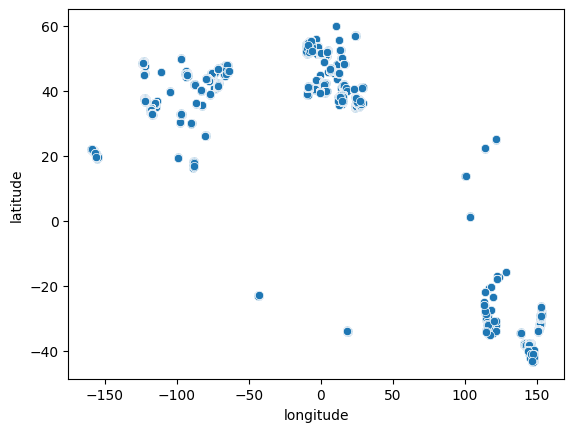

In [11]:
sns.scatterplot(x=df.longitude, y=df.latitude)

In [12]:
map = folium.Map(location=[32, -13], zoom_start=1, width=525, height=425, max_bounds=True, min_zoom=1, max_zoom=13)
lat_lon_pairs = zip(list(df.latitude), list(df.longitude))
HeatMap(lat_lon_pairs).add_to(map)
map

In [13]:
df['lat_rounded'] = df['latitude'].round(2)
df['lon_rounded'] = df['longitude'].round(2)

grouped = df.groupby(['lat_rounded', 'lon_rounded'])['price'].mean().reset_index()

heat_price_data = [[row['lat_rounded'], row['lon_rounded'], row['price']] for index, row in grouped.iterrows()]

map_p = folium.Map(location=[32, -13], zoom_start=1, width=525, height=425, max_bounds=True, min_zoom=1, max_zoom=13)

HeatMap(heat_price_data, radius=13, blur=10).add_to(map_p)

map_p

<function matplotlib.pyplot.show(close=None, block=None)>

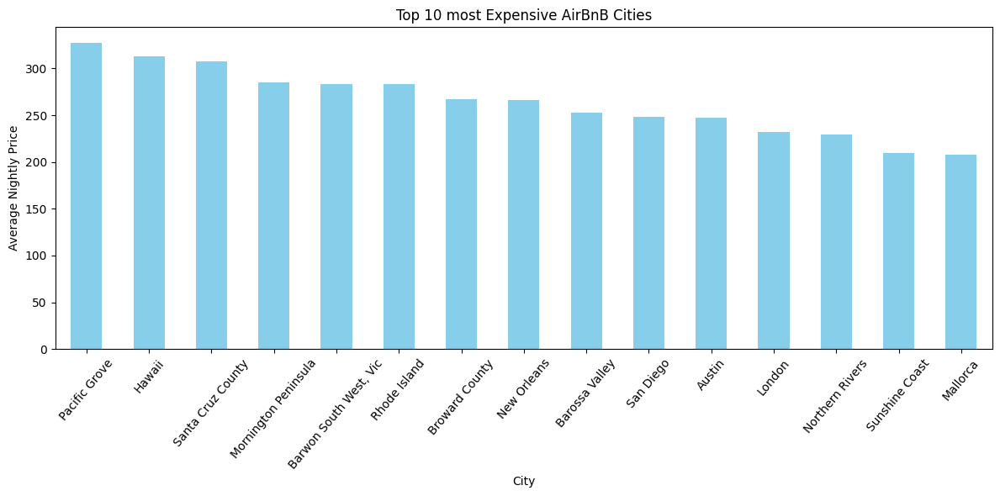

In [14]:
city_high_avg_price = df_copy.groupby('city')['price_usd'].mean().sort_values(ascending=False).head(15)
city_high_avg_price.plot(kind='bar', color='skyblue', figsize=(12,6))

plt.xlabel('City')
plt.ylabel('Average Nightly Price')
plt.title('Top 10 most Expensive AirBnB Cities')
plt.xticks(rotation=50)
plt.tight_layout()
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

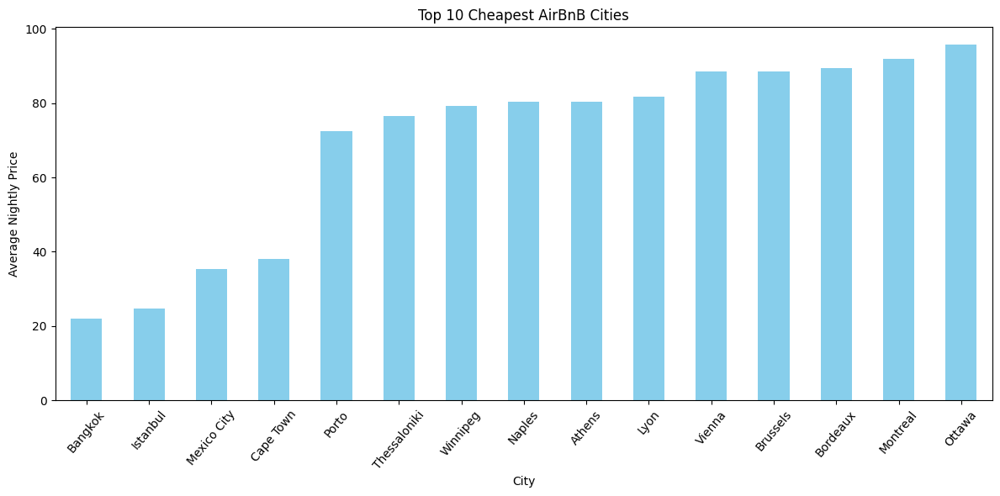

In [15]:
city_low_avg_price = df_copy.groupby('city')['price_usd'].mean().sort_values(ascending=True).head(15)

city_low_avg_price.plot(kind='bar', color='skyblue', figsize=(12,6))
plt.xlabel('City')
plt.ylabel('Average Nightly Price')
plt.title('Top 10 Cheapest AirBnB Cities')
plt.xticks(rotation=50)
plt.tight_layout()
plt.show

In [16]:
city_high_avg_price

city
Pacific Grove             327.785714
Hawaii                    313.313890
Santa Cruz County         307.475845
Mornington Peninsula      285.566074
Barwon South West, Vic    283.123927
Rhode Island              283.008850
Broward County            267.064516
New Orleans               266.541379
Barossa Valley            253.131268
San Diego                 248.377976
Austin                    247.778552
London                    231.828370
Northern Rivers           229.487552
Sunshine Coast            209.751826
Mallorca                  207.514393
Name: price_usd, dtype: float64

In [17]:
city_low_avg_price

city
Bangkok         22.061301
Istanbul        24.792892
Mexico City     35.298142
Cape Town       37.946051
Porto           72.479779
Thessaloniki    76.545015
Winnipeg        79.334466
Naples          80.310854
Athens          80.368993
Lyon            81.819845
Vienna          88.521350
Brussels        88.579040
Bordeaux        89.342826
Montreal        91.842007
Ottawa          95.670628
Name: price_usd, dtype: float64

In [18]:
df_copy["property_type"].value_counts().head(50)

property_type
Entire rental unit                    106394
Entire home                            39892
Entire condo                           21832
Private room in rental unit            19204
Private room in home                   16168
Entire villa                            6720
Private room in bed and breakfast       4870
Room in hotel                           3890
Entire serviced apartment               3881
Entire guest suite                      3640
Entire guesthouse                       3572
Entire townhouse                        3254
Private room in condo                   3226
Entire vacation home                    2593
Entire loft                             2477
Entire cottage                          2288
Private room in townhouse               1573
Room in boutique hotel                  1525
Cycladic home                           1383
Tiny home                                918
Entire cabin                             843
Private room in guesthouse               

In [19]:
valid_property = df_copy['property_type'].value_counts()[df_copy['property_type'].value_counts() >= 100].index
df_property = df_copy[df_copy['property_type'].isin(valid_property)]

<function matplotlib.pyplot.show(close=None, block=None)>

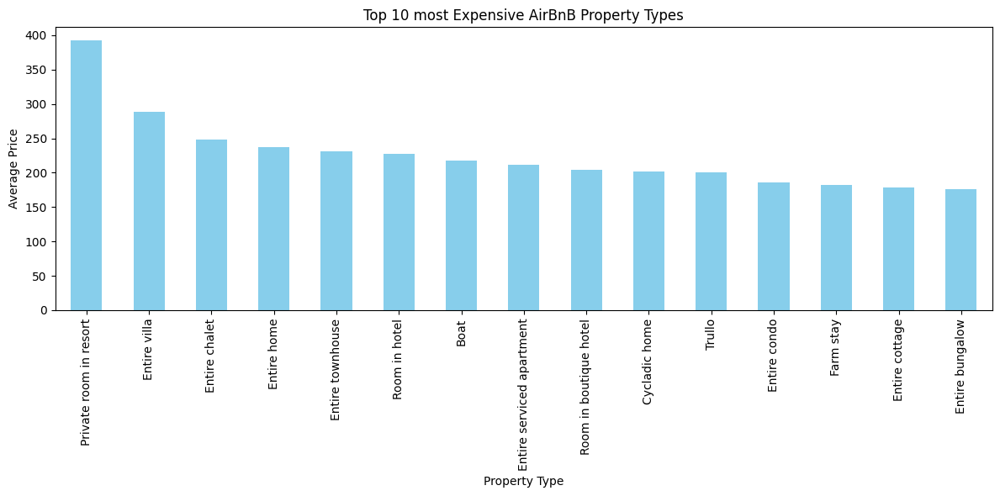

In [20]:
property_high_avg_price = df_property.groupby('property_type')['price_usd'].mean().sort_values(ascending=False).head(15)
property_high_avg_price.plot(kind='bar', color='skyblue', figsize=(12,6))

plt.xlabel('Property Type')
plt.ylabel('Average Price')
plt.title('Top 10 most Expensive AirBnB Property Types')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

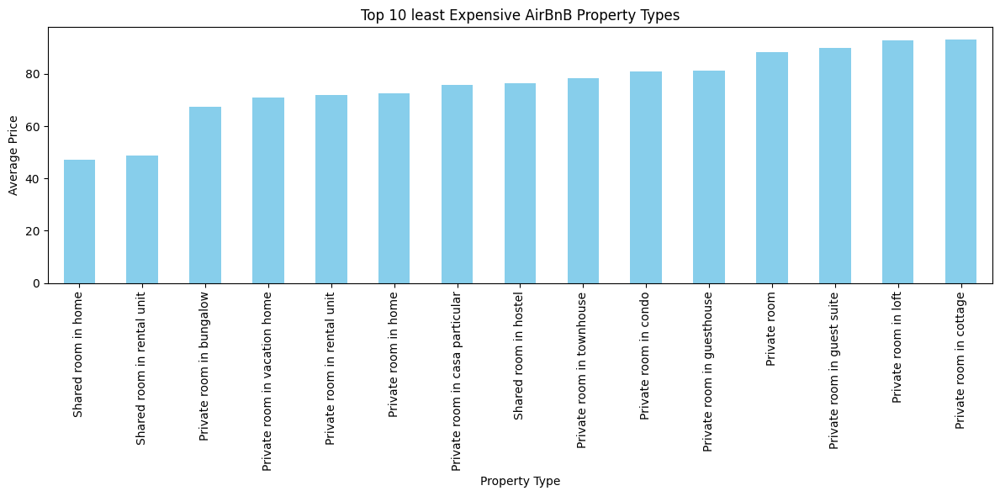

In [21]:
property_low_avg_price = df_property.groupby('property_type')['price_usd'].mean().sort_values(ascending=True).head(15)
property_low_avg_price.plot(kind='bar', color='skyblue', figsize=(12,6))

plt.xlabel('Property Type')
plt.ylabel('Average Price')
plt.title('Top 10 least Expensive AirBnB Property Types')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show

# Questions and Answers

# In what parts of the world is AirBnB most popular?

In [22]:
map = folium.Map(location=[32, -13], zoom_start=1, width=525, height=425, max_bounds=True, min_zoom=1, max_zoom=13)
lat_lon_pairs = zip(list(df.latitude), list(df.longitude))
HeatMap(lat_lon_pairs).add_to(map)
map

After creating a heat map of the Airbnb data using listing coordinates and number of listings in proximity to determine heat levels, there are a number of interesting patterns that emerged. The first and most obvious being that the majority of listings reside in the United States, Europe, and Australia. The high volume of listings in these areas isn't unexpected, as all three share English as a popular choice of dialect and are major tourist locations. Additionally, when zooming in on these individual locations, a common trend was a higher volume of listings based on the proximity of water, with closer proximity leading to an increase in listing volume. In the United States, the majority of listings are on the east and west coastlines; in Europe, it's Ireland and places around the Mediterranean Sea; and in Australia, it's the southeast and west coastlines. Finally, to account for the areas of the world without any listings, I did some additional research, which made it clear that the reasoning is primarily due to a language difference and already having a widespread Airbnb equivalent system in place.

# Where in these popular parts is it most expensive?

In [23]:
df['lat_rounded'] = df['latitude'].round(2)
df['lon_rounded'] = df['longitude'].round(2)

grouped = df.groupby(['lat_rounded', 'lon_rounded'])['price'].mean().reset_index()

heat_price_data = [[row['lat_rounded'], row['lon_rounded'], row['price']] for index, row in grouped.iterrows()]

map_p = folium.Map(location=[32, -13], zoom_start=1, width=525, height=425, max_bounds=True, min_zoom=1, max_zoom=13)

HeatMap(heat_price_data, radius=13, blur=10).add_to(map_p)

map_p

After graphing the data onto another heat map, this time using the mean listing price of an area to determine heat level, patterns similar to the previous heat map became clear. It's important to note the pricing on the mapped listings is not standardized to a single currency, so when looking at a region with high heat levels it should be interpreted as expensive for that region, not expensive compared to the world due to currency exchange rates. This makes the map more responsive to regional trends but less meaningful for the big picture. Naturally, the three major areas remain prevalent in the big picture, but when zoomed in, the high average price areas in these regions correlate similarly to the volume map, with the most expensive areas being high volume areas with close proximity to water. This pattern demonstrates that regardless of the true monetary value of the listings, all regions hold consistent beliefs about what makes an Airbnb valuable, with those beliefs being high population density leading to competitive pricing, locations being tourism-based, and water access for both travel and entertainment.

# What cities in the world have the most and least expensive airBnB's on average?

<function matplotlib.pyplot.show(close=None, block=None)>

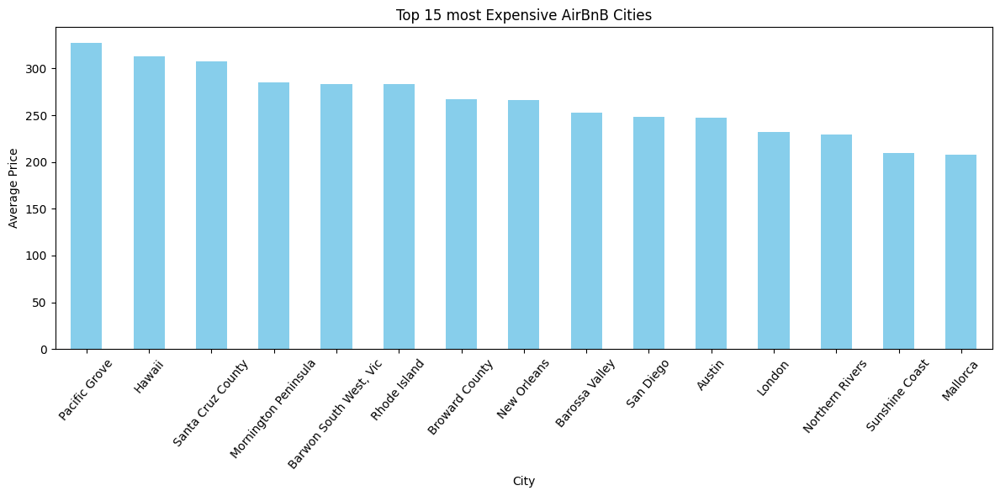

In [24]:
city_high_avg_price = df_copy.groupby('city')['price_usd'].mean().sort_values(ascending=False).head(15)
city_high_avg_price.plot(kind='bar', color='skyblue', figsize=(12,6))

plt.xlabel('City')
plt.ylabel('Average Price')
plt.title('Top 15 most Expensive AirBnB Cities')
plt.xticks(rotation=50)
plt.tight_layout()
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

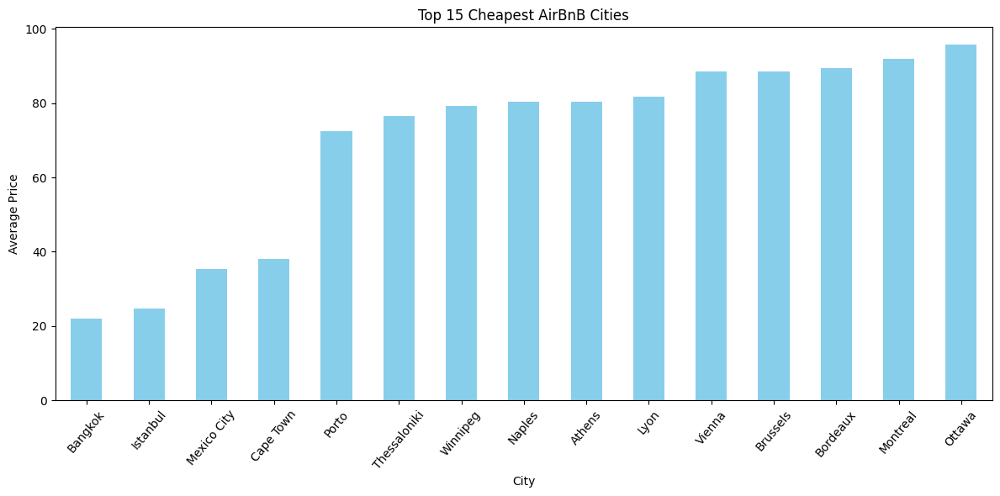

In [25]:
city_low_avg_price = df_copy.groupby('city')['price_usd'].mean().sort_values(ascending=True).head(15)

city_low_avg_price.plot(kind='bar', color='skyblue', figsize=(12,6))
plt.xlabel('City')
plt.ylabel('Average Price')
plt.title('Top 15 Cheapest AirBnB Cities')
plt.xticks(rotation=50)
plt.tight_layout()
plt.show

In order to compare all cities in the world based on Airbnb pricing, all listing prices must be standardized to a single currency to ensure a true comparison unskewed by major exchange rate differences. The currency of choice was USD, and so after converting all the prices, the results were graphed to find the fifteen most and least expensive cities for Airbnb's on average. While these two graphs provide clear general knowledge about what cities are and aren't expensive, taking a closer look reveals some trends about regional pricing. For example, cities in the United States account for over 50% of the top fifteen most expensive cities for Airbnb's on average. The rest of the top fifteen are made up by various major tourist locations. This, along with the fact that there are almost no United States cities in the bottom fifteen, makes it clear that on average Airbnb's are most expensive in the United States to such a degree that it could be considered overpriced.

# What property types are the most and least expensive?

<function matplotlib.pyplot.show(close=None, block=None)>

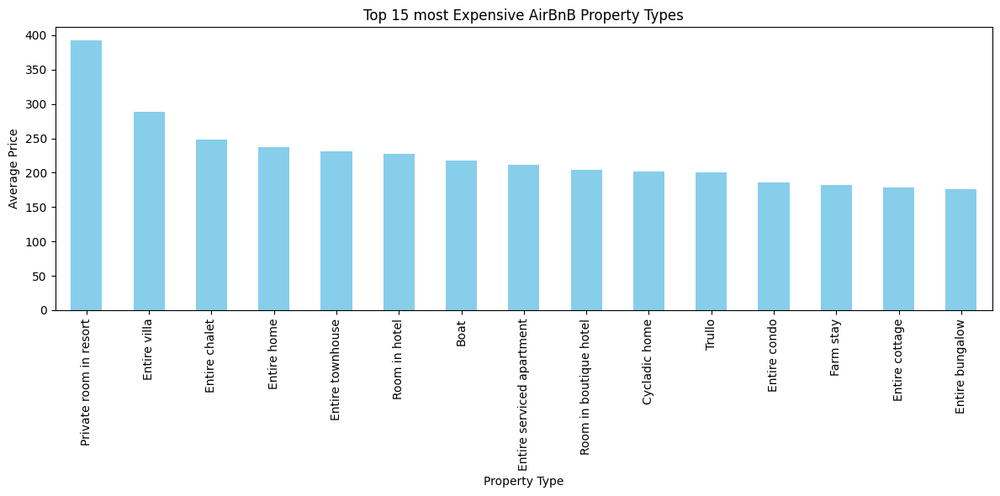

In [26]:
property_high_avg_price = df_property.groupby('property_type')['price_usd'].mean().sort_values(ascending=False).head(15)
property_high_avg_price.plot(kind='bar', color='skyblue', figsize=(12,6))

plt.xlabel('Property Type')
plt.ylabel('Average Price')
plt.title('Top 15 most Expensive AirBnB Property Types')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

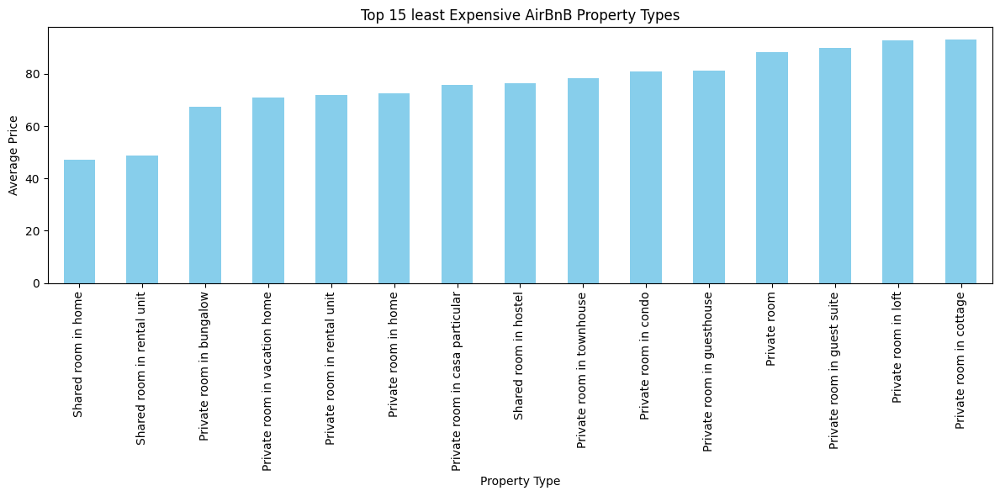

In [27]:
property_low_avg_price = df_property.groupby('property_type')['price_usd'].mean().sort_values(ascending=True).head(15)
property_low_avg_price.plot(kind='bar', color='skyblue', figsize=(12,6))

plt.xlabel('Property Type')
plt.ylabel('Average Price')
plt.title('Top 15 least Expensive AirBnB Property Types')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show

By grouping by property types and comparing with the standardized currency, the fifteen most and least expensive property types can be visualized. For the top fifteen property types, the pattern is clearly a mix of quality and size. The most expensive types are high-end locations and types that contain the word "entire," indicating more room. Meanwhile, the fifteen least expensive types also show a clear pattern, with almost every type involving a shared room or a private room in a shared area. This pattern only reinforces the idea that the main predictor of price for a given property type is the size of the space, with larger sizes correlating to more value.

# Summary and Conclusion

This exploratory data analysis used a database of over a quarter million Airbnb property listings in order to reveal trends in popularity and cost, allowing for better-informed traveling decisions. Immediately, the data was visualized into a heat map to show that Airbnb is most popular in the USA, Europe, and Australia. Altering the mapping to take into account price showed that in these areas, coastal and highly populated locations are valued consistently higher than regions that lack these qualities.

Then, to determine which cities and property types were the most and least expensive, all listing prices were converted to USD to create a standardized currency so a proper comparison could be made. These comparisons were then visualized in bar graphs, which provided insight into trends. For cities, the trend was clear: the US was by far the most expensive location, with over 50% of the top fifteen cities being in the US, while the bottom fifteen contained almost no US cities.

In terms of property types, it is highly likely that the main contributing factor to cost is space, as the most expensive property types provided an entire location, while the cheapest were almost all shared spaces to some degree.

In conclusion, analyzing this database has provided clear insight into Airbnb trends, which allows a person to answer important travel questions such as “Where can I go and what property type can I get to minimize cost?” and “How likely am I to find an Airbnb to stay at given my destination?” Having these insights will not only consistently save a person money and allow for a more optimized travel plan, but could also be leveraged by someone listing Airbnbs to increase profits and improve booking rates.